In [75]:
from keras.layers import LSTM
from keras.models import Sequential
from keras.optimizers import sgd, adam
from keras.callbacks import ModelCheckpoint, EarlyStopping, Callback
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split

In [20]:
f1 = lambda t: np.sin(t) + 0.25 * np.random.randn(*t.shape)
f2 = lambda t: np.sin(t) + np.sin(np.pi * t) + 0.25 * np.random.randn(*t.shape)

In [21]:
t = np.linspace(0, 10, 250).reshape(1, 250, 1)
t = np.repeat(t, 100, axis=0)
t.shape

(100, 250, 1)

In [22]:
y = np.concatenate([f1(t), f2(t)], axis=2).reshape(100, 250, 2)
y.shape

(100, 250, 2)

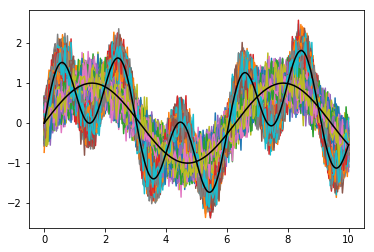

In [23]:
fig, ax = plt.subplots()

for i in range(t.shape[0]):

    ax.plot(t[i,:,0], y[i,:,0])
    ax.plot(t[i,:,0], y[i,:,1])

ax.plot(t[0,:,0], np.sin(t[0,:,0]), 'k-')
ax.plot(t[0,:,0], np.sin(t[0,:,0]) + np.sin(np.pi * t[0,:,0]), 'k-')
    
plt.show()

In [24]:
LOOK_BACK = 7

x = np.zeros([100, 250, 2 * LOOK_BACK])

for i in range(x.shape[0]):
    for j in range(LOOK_BACK, x.shape[1]):
        x[i][j] += y[i][j - LOOK_BACK:j].reshape(2 * LOOK_BACK)

In [25]:
x = x[:,LOOK_BACK:,:]
y = y[:,LOOK_BACK:,:]

In [26]:
split = x.shape[1] - x.shape[1] // 4

x_train, x_test = x[:,:split,:], x[:,split:,:]
y_train, y_test = y[:,:split,:], y[:,split:,:]

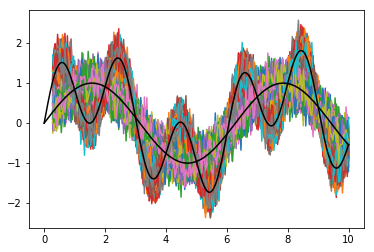

In [27]:
fig, ax = plt.subplots()

for i in range(x_train.shape[0]):
    
    ax.plot(t[i,LOOK_BACK:y_train.shape[1] + LOOK_BACK,0], y_train[i,:,0])
    ax.plot(t[i,LOOK_BACK:y_train.shape[1] + LOOK_BACK,0], y_train[i,:,1])
    
    ax.plot(t[i,-y_test.shape[1]:,0], y_test[i,:,0])
    ax.plot(t[i,-y_test.shape[1]:,0], y_test[i,:,1])

ax.plot(t[0,:,0], np.sin(t[0,:,0]), 'k-')
ax.plot(t[0,:,0], np.sin(t[0,:,0]) + np.sin(np.pi * t[0,:,0]), 'k-')

plt.show()

In [105]:
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(None, 2 * LOOK_BACK)))
model.add(LSTM(10, return_sequences=True))
model.add(LSTM(2, return_sequences=True, activation='linear'))
optimizer = adam(lr=0.01)
model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_24 (LSTM)               (None, None, 50)          13000     
_________________________________________________________________
lstm_25 (LSTM)               (None, None, 10)          2440      
_________________________________________________________________
lstm_26 (LSTM)               (None, None, 2)           104       
Total params: 15,544
Trainable params: 15,544
Non-trainable params: 0
_________________________________________________________________


In [106]:
class Display(Callback):
    def __init__(self):
        self.all_history = {
            'val_loss': [],
            'val_acc': [],
            'loss': [],
            'acc': []
        }
        
    def on_epoch_end(self, batch, logs={}):
                
        self.all_history['val_loss'].append(logs['val_loss'])
        self.all_history['val_acc'].append(logs['val_acc'])
        self.all_history['loss'].append(logs['loss'])
        self.all_history['acc'].append(logs['acc'])
                
        fig, ax = plt.subplots()

        ax.plot(range(len(self.all_history['val_loss'])), self.all_history['val_loss'], label='Test')
        ax.plot(range(len(self.all_history['loss'])), self.all_history['loss'], label='Train')

        ax.legend()

        plt.show()

        y_pred_train = self.model.predict(x_train)
        y_pred_test = self.model.predict(x_test)

        fig, ax = plt.subplots()

        for i in range(x_train.shape[0]):

            ax.plot(t[i,LOOK_BACK:y_pred_train.shape[1] + LOOK_BACK,0], y_pred_train[i,:,0])
            ax.plot(t[i,LOOK_BACK:y_pred_train.shape[1] + LOOK_BACK,0], y_pred_train[i,:,1])

            ax.plot(t[i,-y_pred_test.shape[1]:,0], y_pred_test[i,:,0])
            ax.plot(t[i,-y_pred_test.shape[1]:,0], y_pred_test[i,:,1])

        ax.plot(t[0,:,0], np.sin(t[0,:,0]), 'k-')
        ax.plot(t[0,:,0], np.sin(t[0,:,0]) + np.sin(np.pi * t[0,:,0]), 'k-')

        plt.show()

In [107]:
early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=100)
best_model = ModelCheckpoint('best_model.bin', monitor='val_acc', mode='max', save_best_only=True)
display = Display()

Train on 100 samples, validate on 100 samples
Epoch 1/10000000
100/100 [==============================] - 13s 134ms/step - loss: 0.8272 - acc: 0.4433 - val_loss: 0.5170 - val_acc: 0.7417


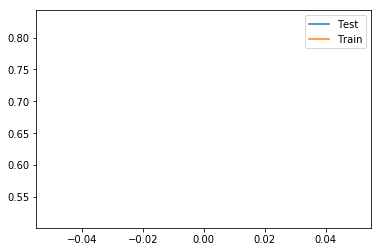

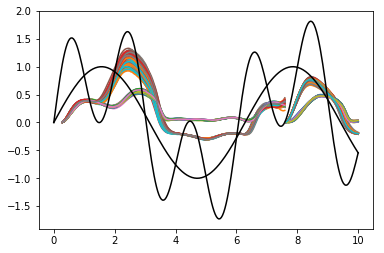

Epoch 2/10000000
100/100 [==============================] - 7s 75ms/step - loss: 0.5951 - acc: 0.5177 - val_loss: 0.6122 - val_acc: 0.5038


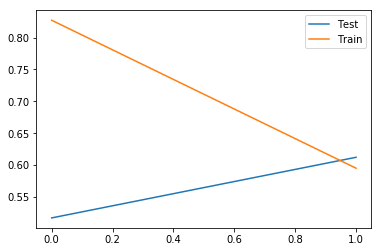

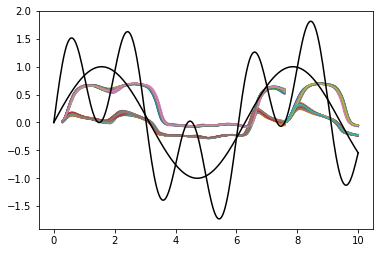

Epoch 3/10000000
100/100 [==============================] - 8s 76ms/step - loss: 0.5273 - acc: 0.5282 - val_loss: 0.5352 - val_acc: 0.5277


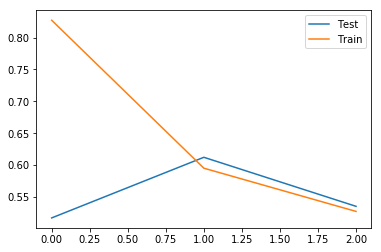

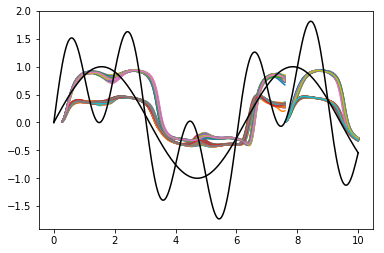

Epoch 4/10000000
100/100 [==============================] - 8s 77ms/step - loss: 0.4054 - acc: 0.5713 - val_loss: 0.3906 - val_acc: 0.6575


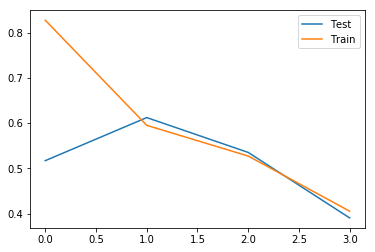

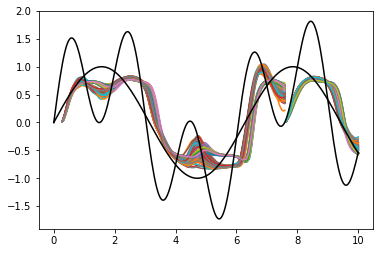

Epoch 5/10000000
100/100 [==============================] - 8s 77ms/step - loss: 0.2942 - acc: 0.8098 - val_loss: 0.2104 - val_acc: 0.6737


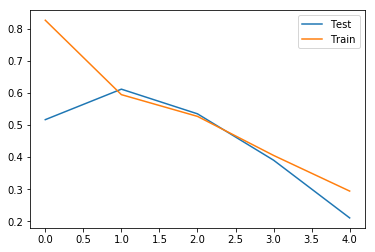

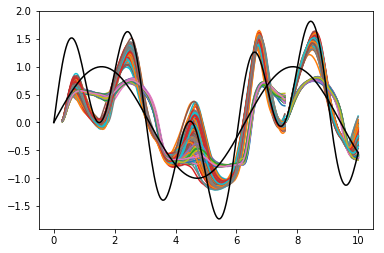

Epoch 6/10000000
100/100 [==============================] - 7s 75ms/step - loss: 0.2256 - acc: 0.8301 - val_loss: 0.2152 - val_acc: 0.5980


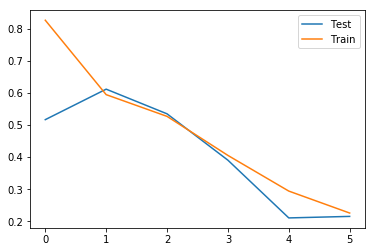

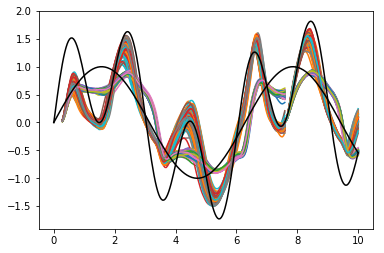

Epoch 7/10000000
100/100 [==============================] - 7s 75ms/step - loss: 0.1963 - acc: 0.8080 - val_loss: 0.2637 - val_acc: 0.5378


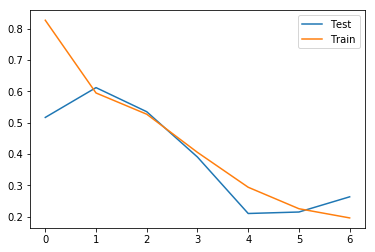

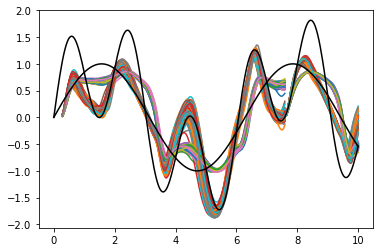

Epoch 8/10000000
100/100 [==============================] - 7s 72ms/step - loss: 0.1894 - acc: 0.7602 - val_loss: 0.2438 - val_acc: 0.6528


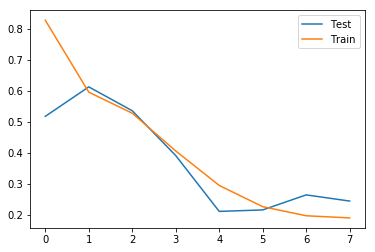

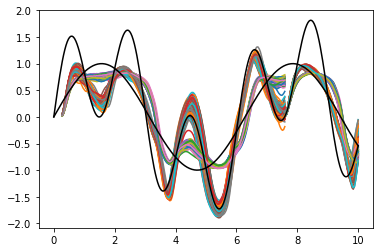

Epoch 9/10000000
100/100 [==============================] - 8s 77ms/step - loss: 0.1585 - acc: 0.8478 - val_loss: 0.1749 - val_acc: 0.7762


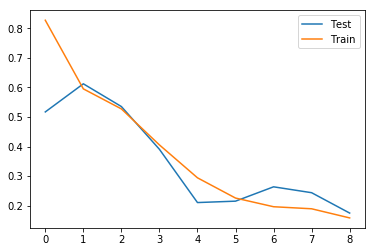

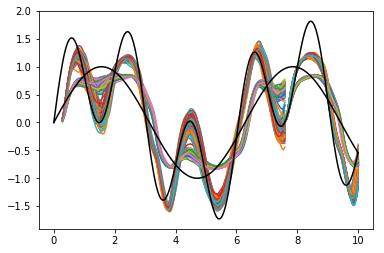

Epoch 10/10000000
100/100 [==============================] - 8s 77ms/step - loss: 0.1348 - acc: 0.8673 - val_loss: 0.1362 - val_acc: 0.7733


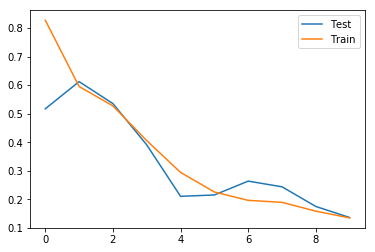

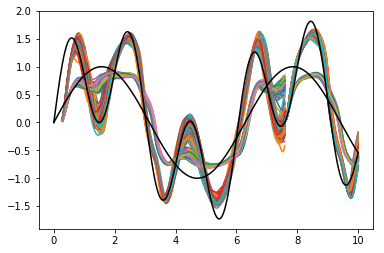

Epoch 11/10000000
100/100 [==============================] - 7s 74ms/step - loss: 0.1197 - acc: 0.8672 - val_loss: 0.1321 - val_acc: 0.7535


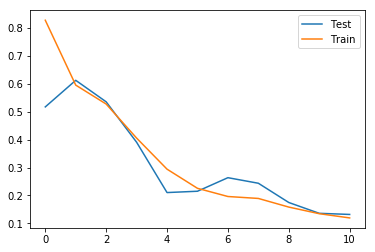

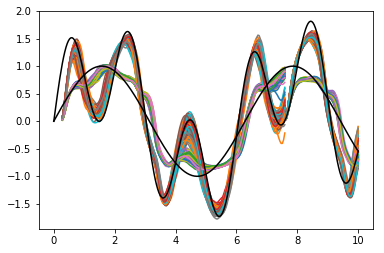

Epoch 12/10000000
100/100 [==============================] - 8s 84ms/step - loss: 0.1088 - acc: 0.8741 - val_loss: 0.1355 - val_acc: 0.7557


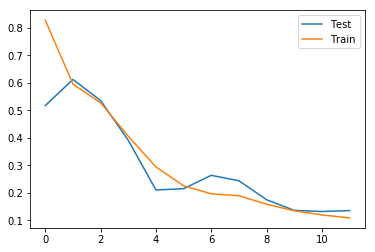

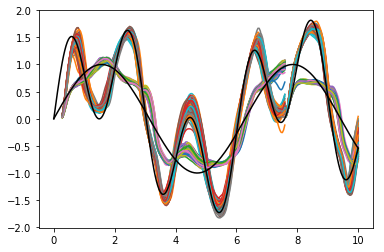

Epoch 13/10000000
100/100 [==============================] - 8s 75ms/step - loss: 0.0990 - acc: 0.8909 - val_loss: 0.1440 - val_acc: 0.7538


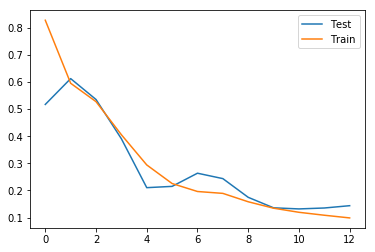

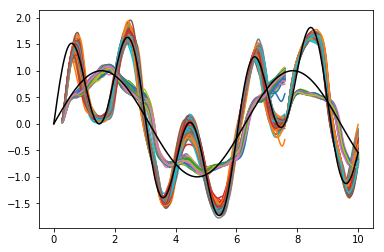

Epoch 14/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0945 - acc: 0.8939 - val_loss: 0.1424 - val_acc: 0.7500


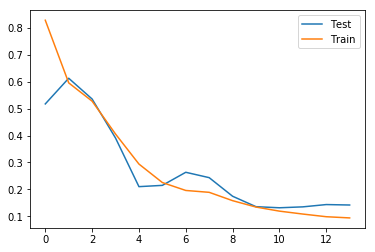

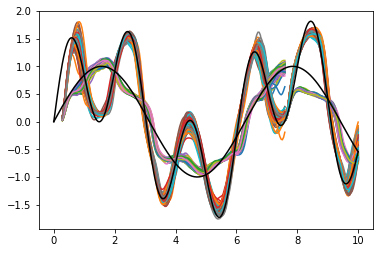

Epoch 15/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0899 - acc: 0.8941 - val_loss: 0.1350 - val_acc: 0.7623


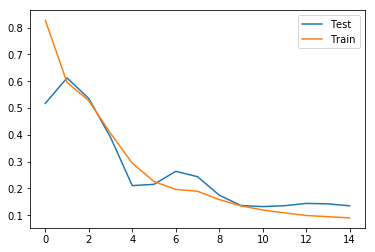

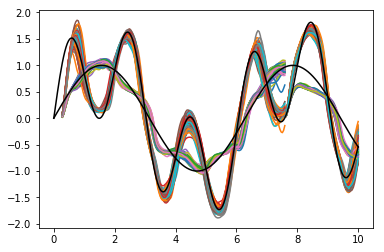

Epoch 16/10000000
100/100 [==============================] - 7s 71ms/step - loss: 0.0874 - acc: 0.8931 - val_loss: 0.1331 - val_acc: 0.7513


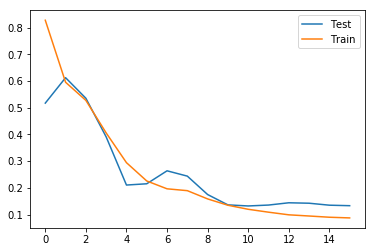

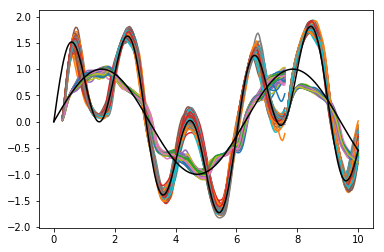

Epoch 17/10000000
100/100 [==============================] - 8s 82ms/step - loss: 0.0850 - acc: 0.8971 - val_loss: 0.1277 - val_acc: 0.7610


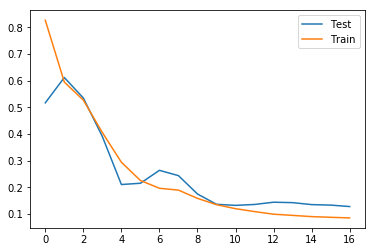

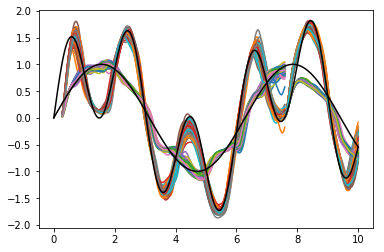

Epoch 18/10000000
100/100 [==============================] - 7s 74ms/step - loss: 0.0847 - acc: 0.8995 - val_loss: 0.1310 - val_acc: 0.7565


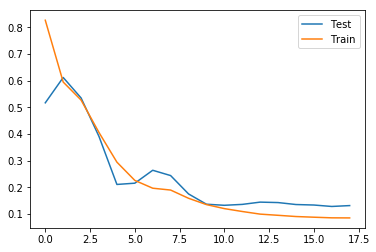

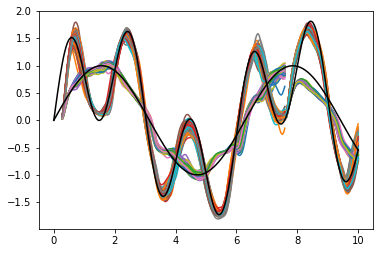

Epoch 19/10000000
100/100 [==============================] - 8s 77ms/step - loss: 0.0820 - acc: 0.9025 - val_loss: 0.1287 - val_acc: 0.7490


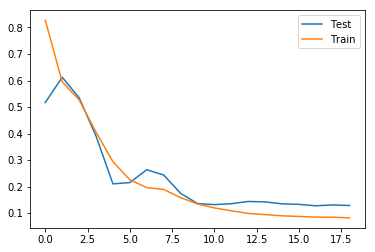

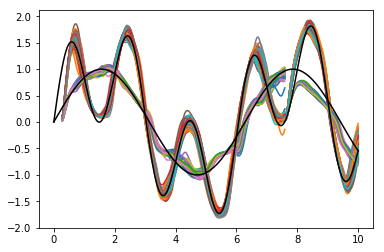

Epoch 20/10000000
100/100 [==============================] - 7s 72ms/step - loss: 0.0801 - acc: 0.9031 - val_loss: 0.1265 - val_acc: 0.7592


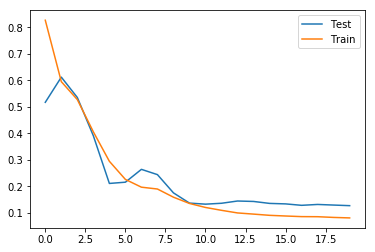

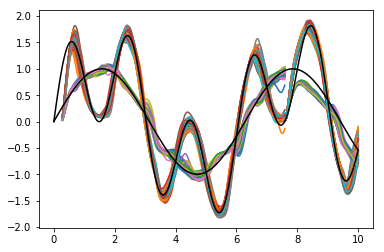

Epoch 21/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0791 - acc: 0.9036 - val_loss: 0.1318 - val_acc: 0.7660


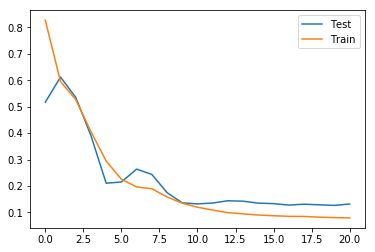

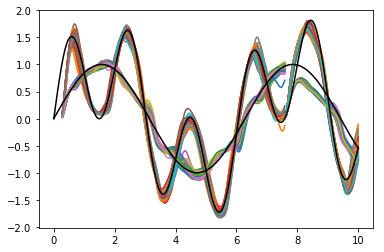

Epoch 22/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0784 - acc: 0.9028 - val_loss: 0.1279 - val_acc: 0.7495


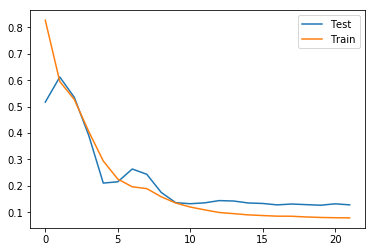

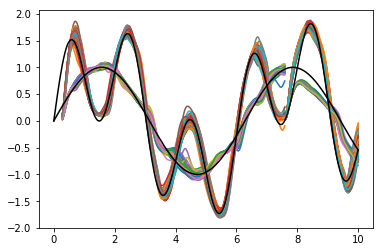

Epoch 23/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0784 - acc: 0.9045 - val_loss: 0.1299 - val_acc: 0.7637


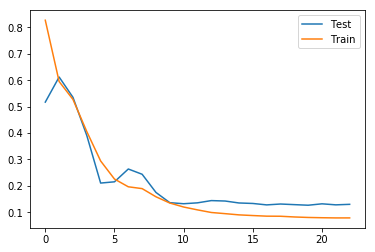

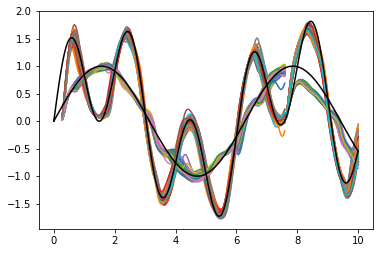

Epoch 24/10000000
100/100 [==============================] - 7s 71ms/step - loss: 0.0770 - acc: 0.9049 - val_loss: 0.1290 - val_acc: 0.7673


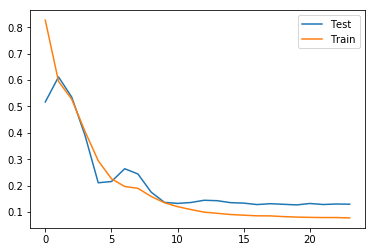

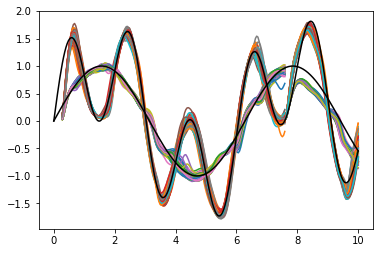

Epoch 25/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0768 - acc: 0.9034 - val_loss: 0.1197 - val_acc: 0.7608


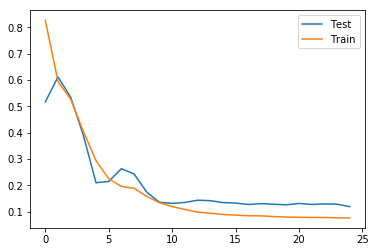

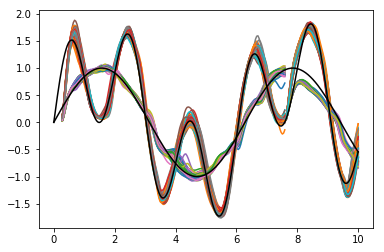

Epoch 26/10000000
100/100 [==============================] - 7s 74ms/step - loss: 0.0764 - acc: 0.9061 - val_loss: 0.1293 - val_acc: 0.7695


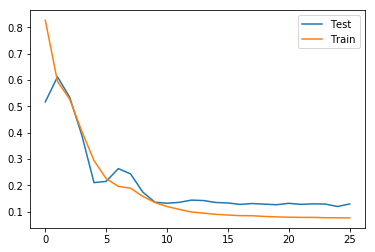

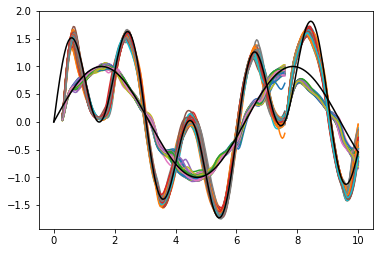

Epoch 27/10000000
100/100 [==============================] - 7s 74ms/step - loss: 0.0755 - acc: 0.9068 - val_loss: 0.1186 - val_acc: 0.7618


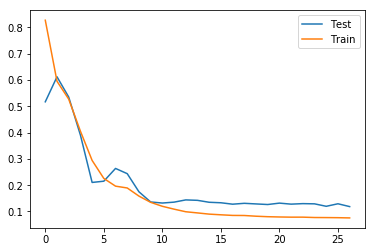

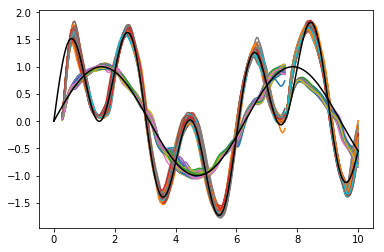

Epoch 28/10000000
100/100 [==============================] - 11s 106ms/step - loss: 0.0749 - acc: 0.9058 - val_loss: 0.1264 - val_acc: 0.7708


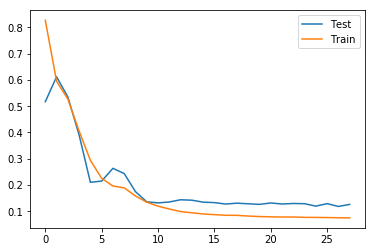

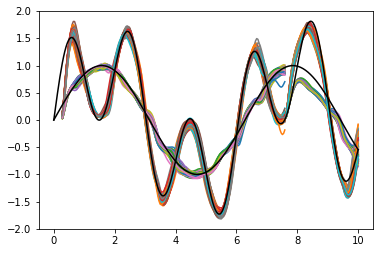

Epoch 29/10000000
100/100 [==============================] - 7s 74ms/step - loss: 0.0746 - acc: 0.9082 - val_loss: 0.1253 - val_acc: 0.7743


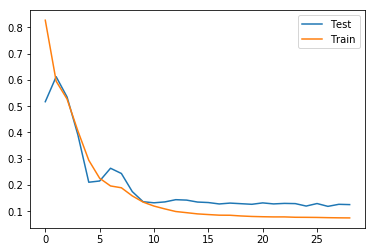

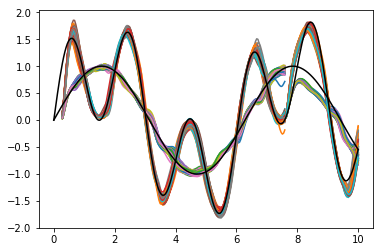

Epoch 30/10000000
100/100 [==============================] - 7s 74ms/step - loss: 0.0737 - acc: 0.9066 - val_loss: 0.1217 - val_acc: 0.7675


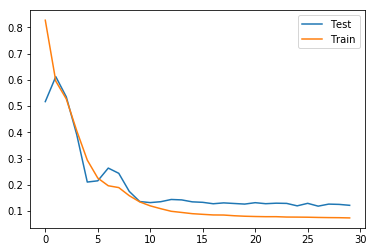

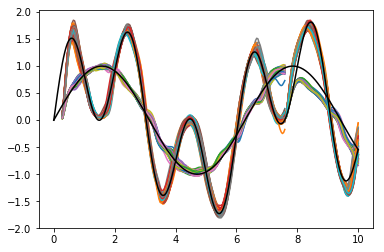

Epoch 31/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0733 - acc: 0.9078 - val_loss: 0.1256 - val_acc: 0.7718


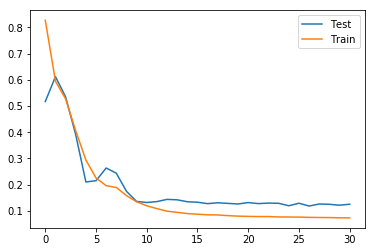

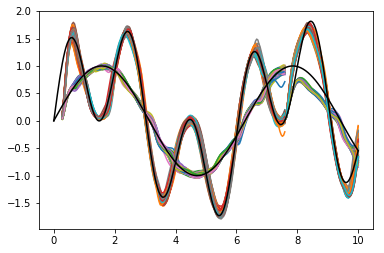

Epoch 32/10000000
100/100 [==============================] - 7s 70ms/step - loss: 0.0730 - acc: 0.9074 - val_loss: 0.1235 - val_acc: 0.7722


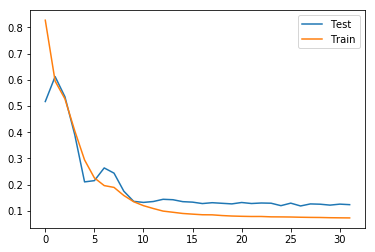

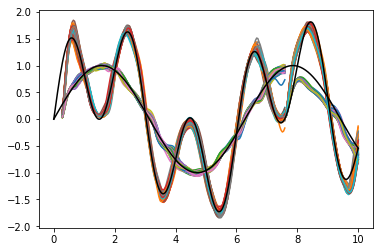

Epoch 33/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0728 - acc: 0.9074 - val_loss: 0.1258 - val_acc: 0.7722


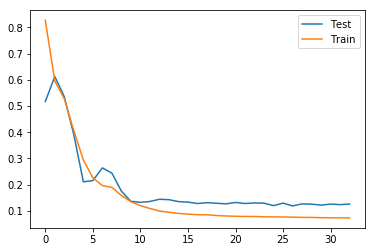

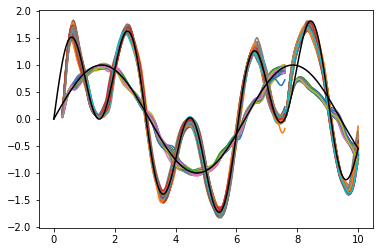

Epoch 34/10000000
100/100 [==============================] - 7s 75ms/step - loss: 0.0724 - acc: 0.9062 - val_loss: 0.1326 - val_acc: 0.7792


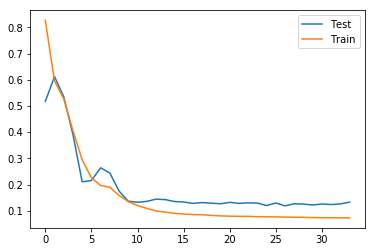

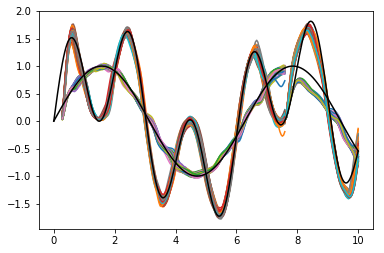

Epoch 35/10000000
100/100 [==============================] - 7s 69ms/step - loss: 0.0726 - acc: 0.9069 - val_loss: 0.1243 - val_acc: 0.7743


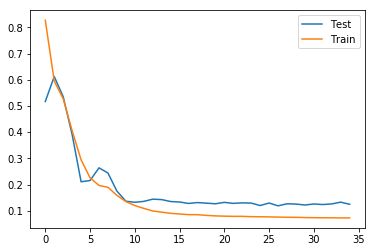

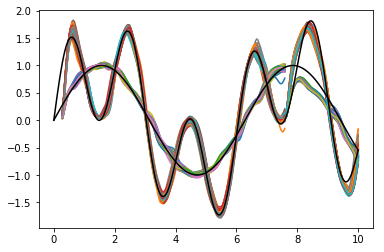

Epoch 36/10000000
100/100 [==============================] - 12s 116ms/step - loss: 0.0719 - acc: 0.9083 - val_loss: 0.1324 - val_acc: 0.7788


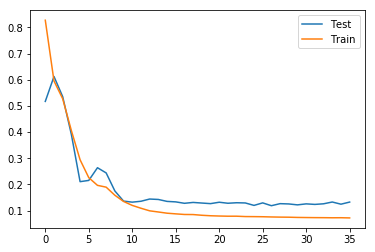

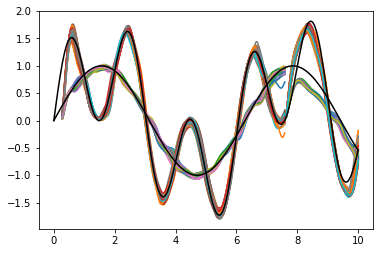

Epoch 37/10000000
100/100 [==============================] - 8s 78ms/step - loss: 0.0716 - acc: 0.9084 - val_loss: 0.1288 - val_acc: 0.7787


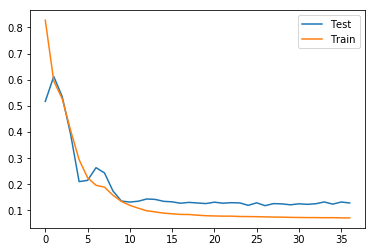

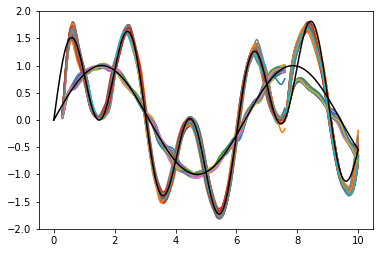

Epoch 38/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0713 - acc: 0.9079 - val_loss: 0.1279 - val_acc: 0.7760


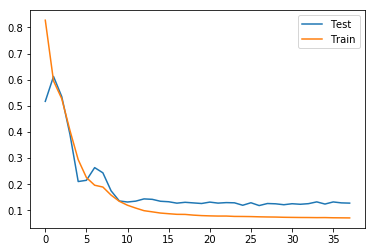

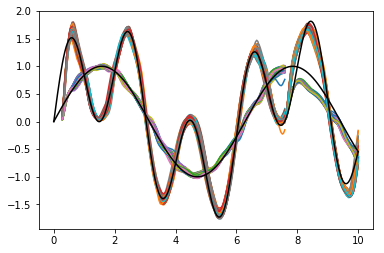

Epoch 39/10000000
100/100 [==============================] - 7s 74ms/step - loss: 0.0713 - acc: 0.9079 - val_loss: 0.1331 - val_acc: 0.7773


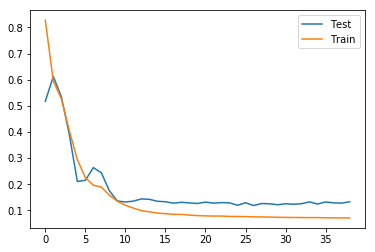

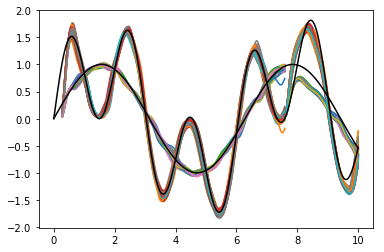

Epoch 40/10000000
100/100 [==============================] - 7s 73ms/step - loss: 0.0713 - acc: 0.9075 - val_loss: 0.1315 - val_acc: 0.7780


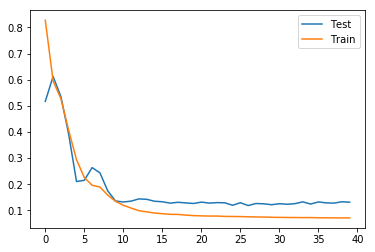

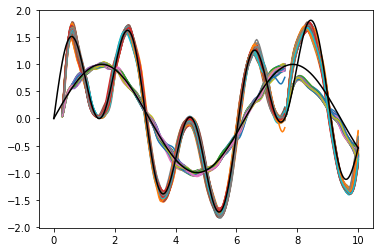

Epoch 41/10000000
100/100 [==============================] - 7s 69ms/step - loss: 0.0710 - acc: 0.9081 - val_loss: 0.1285 - val_acc: 0.7750


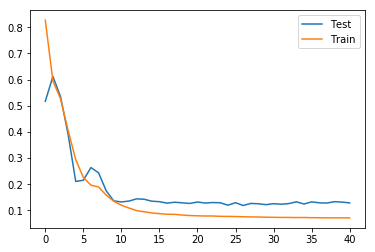

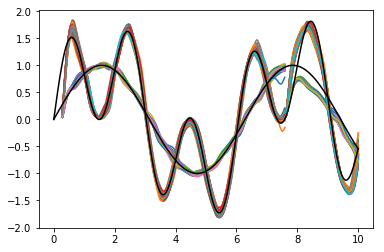

Epoch 42/10000000
100/100 [==============================] - 8s 83ms/step - loss: 0.0708 - acc: 0.9074 - val_loss: 0.1378 - val_acc: 0.7802


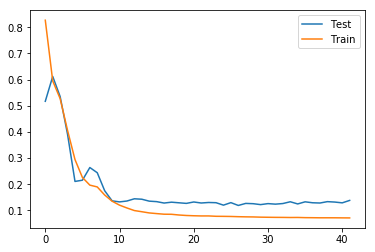

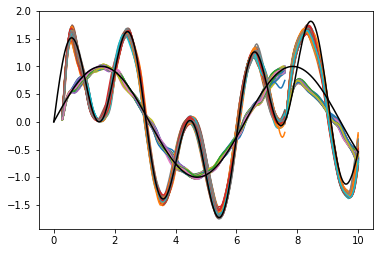

Epoch 43/10000000
100/100 [==============================] - 5s 50ms/step - loss: 0.0710 - acc: 0.9081 - val_loss: 0.1295 - val_acc: 0.7765


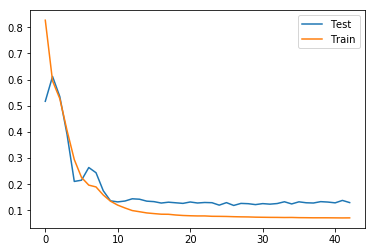

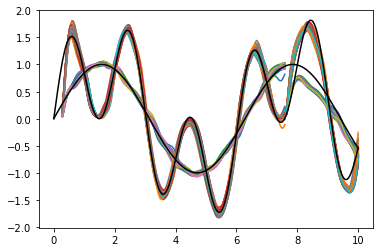

Epoch 44/10000000
100/100 [==============================] - 5s 48ms/step - loss: 0.0706 - acc: 0.9081 - val_loss: 0.1308 - val_acc: 0.7750


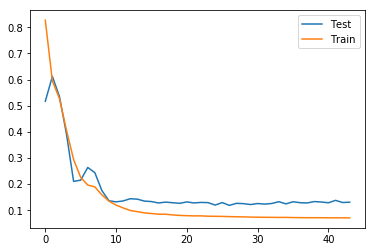

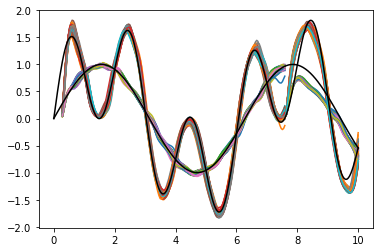

Epoch 45/10000000
100/100 [==============================] - 5s 49ms/step - loss: 0.0708 - acc: 0.9062 - val_loss: 0.1430 - val_acc: 0.7805


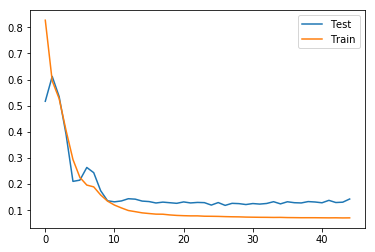

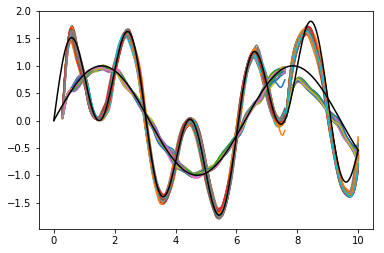

Epoch 46/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0703 - acc: 0.9085 - val_loss: 0.1300 - val_acc: 0.7782


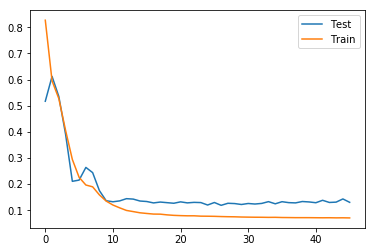

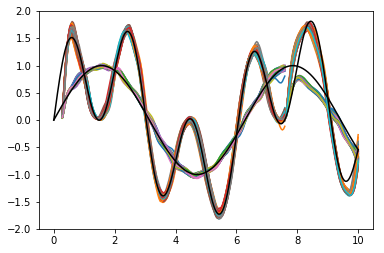

Epoch 47/10000000
100/100 [==============================] - 5s 50ms/step - loss: 0.0700 - acc: 0.9087 - val_loss: 0.1365 - val_acc: 0.7778


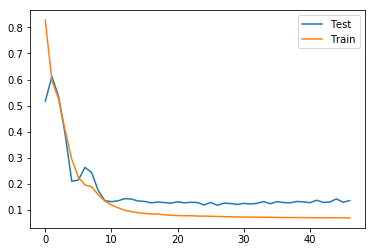

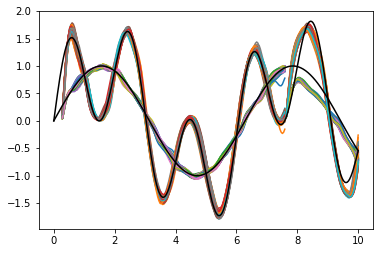

Epoch 48/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0700 - acc: 0.9083 - val_loss: 0.1434 - val_acc: 0.7800


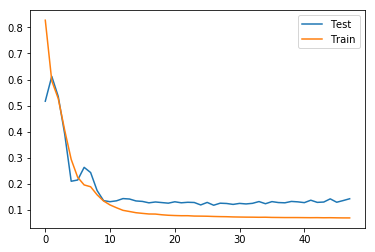

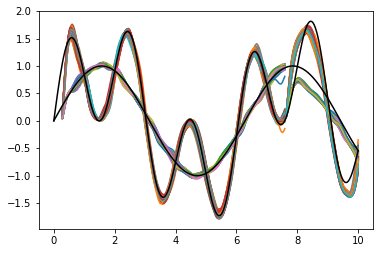

Epoch 49/10000000
100/100 [==============================] - 5s 46ms/step - loss: 0.0698 - acc: 0.9095 - val_loss: 0.1348 - val_acc: 0.7768


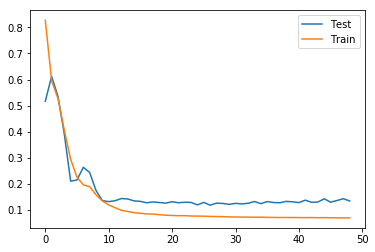

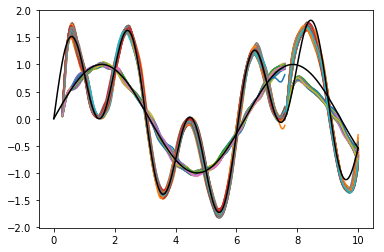

Epoch 50/10000000
100/100 [==============================] - 5s 55ms/step - loss: 0.0695 - acc: 0.9084 - val_loss: 0.1338 - val_acc: 0.7772


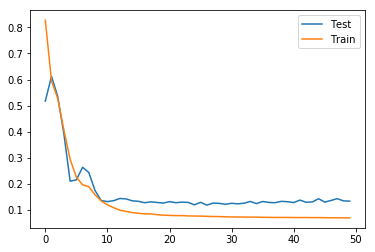

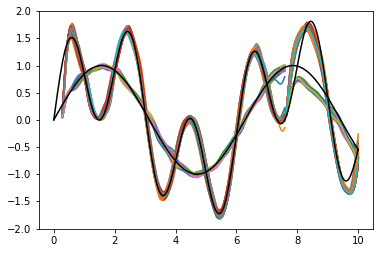

Epoch 51/10000000
100/100 [==============================] - 4s 45ms/step - loss: 0.0695 - acc: 0.9076 - val_loss: 0.1417 - val_acc: 0.7800


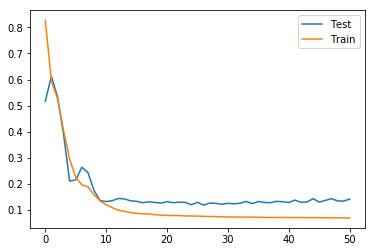

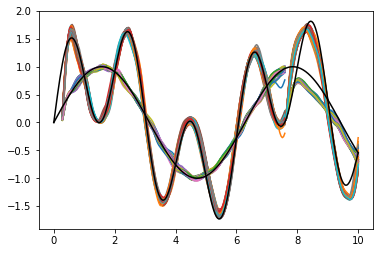

Epoch 52/10000000
100/100 [==============================] - 4s 44ms/step - loss: 0.0699 - acc: 0.9085 - val_loss: 0.1421 - val_acc: 0.7795


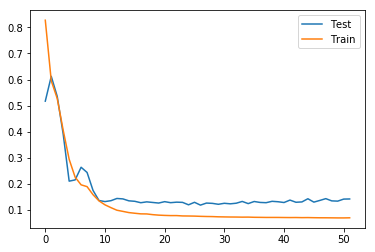

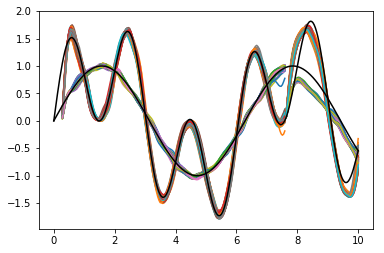

Epoch 53/10000000
100/100 [==============================] - 4s 44ms/step - loss: 0.0691 - acc: 0.9096 - val_loss: 0.1356 - val_acc: 0.7775


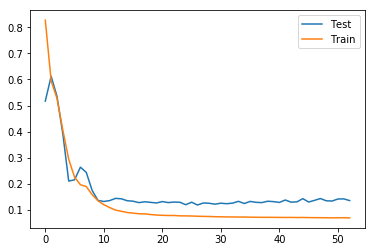

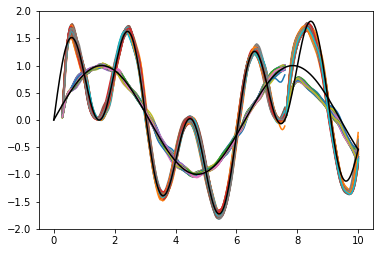

Epoch 54/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0691 - acc: 0.9081 - val_loss: 0.1431 - val_acc: 0.7798


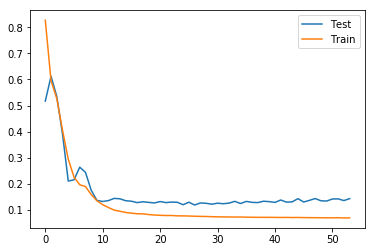

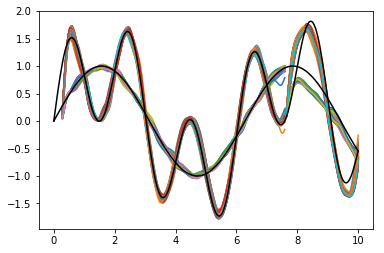

Epoch 55/10000000
100/100 [==============================] - 4s 45ms/step - loss: 0.0688 - acc: 0.9091 - val_loss: 0.1467 - val_acc: 0.7802


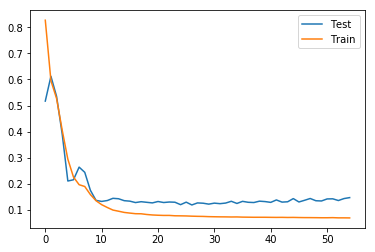

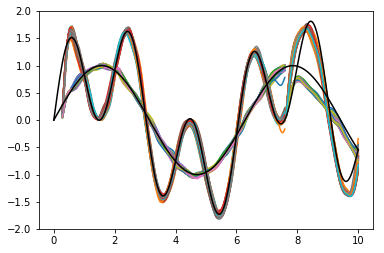

Epoch 56/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0688 - acc: 0.9093 - val_loss: 0.1386 - val_acc: 0.7792


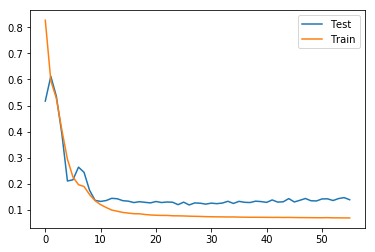

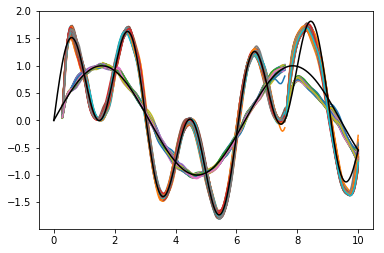

Epoch 57/10000000
100/100 [==============================] - 8s 80ms/step - loss: 0.0687 - acc: 0.9089 - val_loss: 0.1481 - val_acc: 0.7803


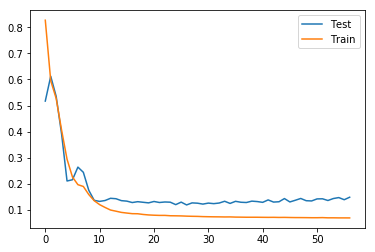

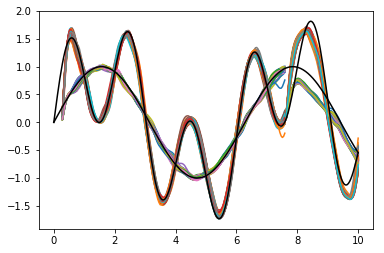

Epoch 58/10000000
100/100 [==============================] - 10s 103ms/step - loss: 0.0689 - acc: 0.9098 - val_loss: 0.1454 - val_acc: 0.7803


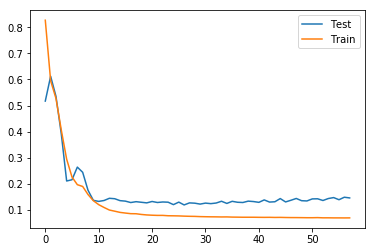

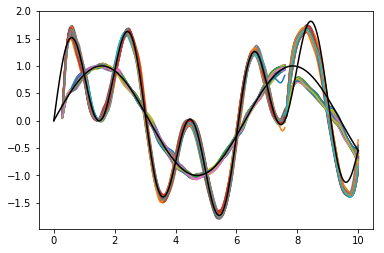

Epoch 59/10000000
100/100 [==============================] - 13s 132ms/step - loss: 0.0685 - acc: 0.9089 - val_loss: 0.1464 - val_acc: 0.7810


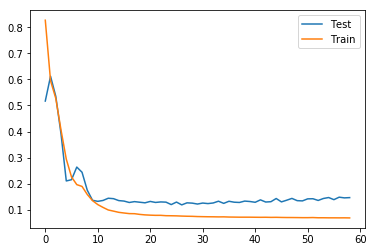

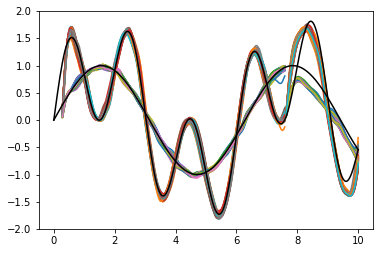

Epoch 60/10000000
100/100 [==============================] - 7s 72ms/step - loss: 0.0683 - acc: 0.9087 - val_loss: 0.1435 - val_acc: 0.7805


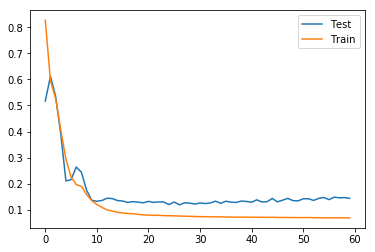

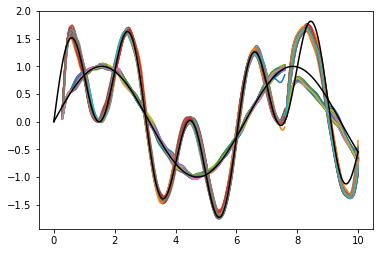

Epoch 61/10000000
100/100 [==============================] - 6s 58ms/step - loss: 0.0683 - acc: 0.9086 - val_loss: 0.1520 - val_acc: 0.7803


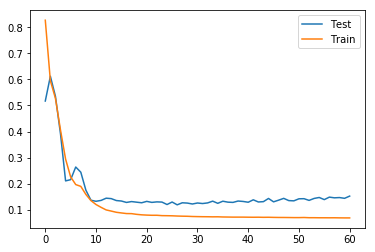

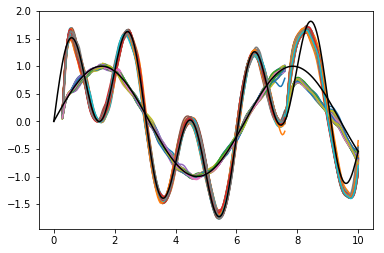

Epoch 62/10000000
100/100 [==============================] - 6s 56ms/step - loss: 0.0684 - acc: 0.9092 - val_loss: 0.1466 - val_acc: 0.7807


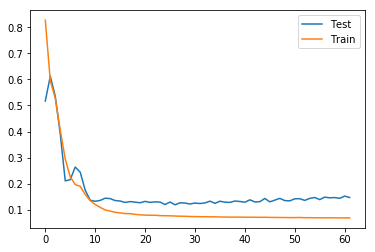

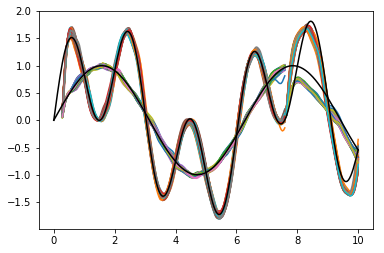

Epoch 63/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0681 - acc: 0.9092 - val_loss: 0.1448 - val_acc: 0.7785


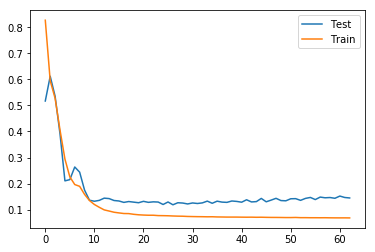

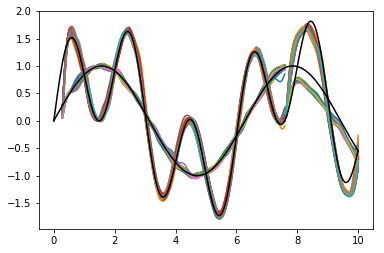

Epoch 64/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0681 - acc: 0.9083 - val_loss: 0.1515 - val_acc: 0.7810


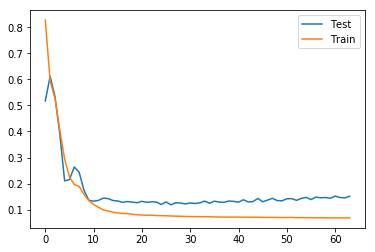

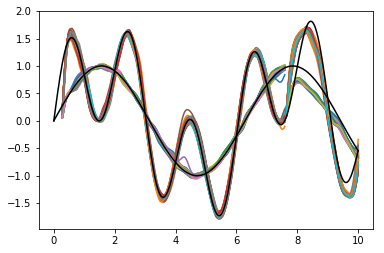

Epoch 65/10000000
100/100 [==============================] - 5s 46ms/step - loss: 0.0679 - acc: 0.9101 - val_loss: 0.1538 - val_acc: 0.7782


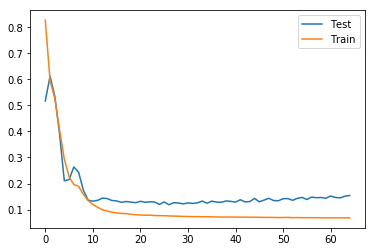

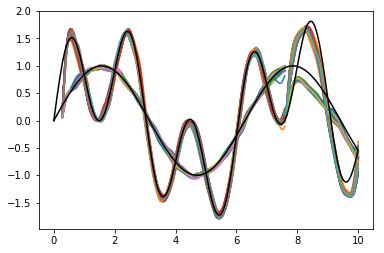

Epoch 66/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0679 - acc: 0.9097 - val_loss: 0.1476 - val_acc: 0.7803


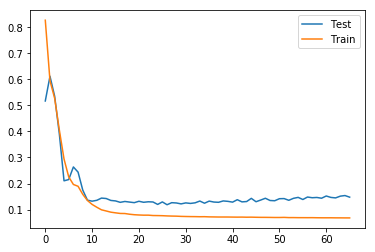

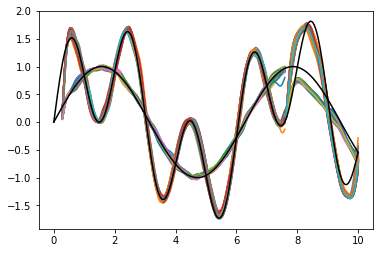

Epoch 67/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0679 - acc: 0.9092 - val_loss: 0.1481 - val_acc: 0.7807


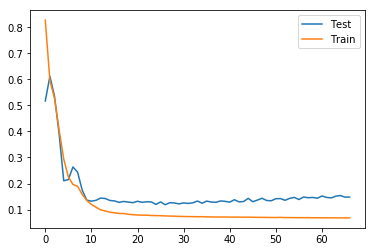

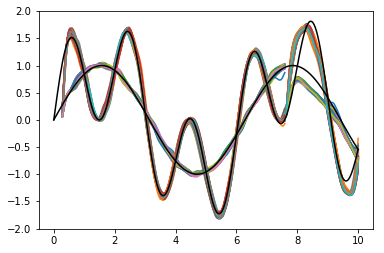

Epoch 68/10000000
100/100 [==============================] - 5s 46ms/step - loss: 0.0678 - acc: 0.9099 - val_loss: 0.1610 - val_acc: 0.7793


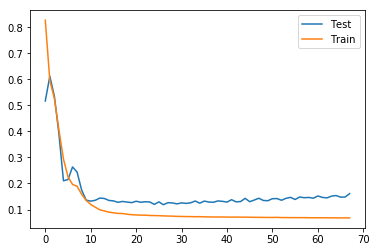

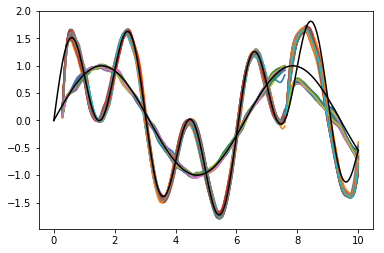

Epoch 69/10000000
100/100 [==============================] - 5s 47ms/step - loss: 0.0677 - acc: 0.9093 - val_loss: 0.1523 - val_acc: 0.7807


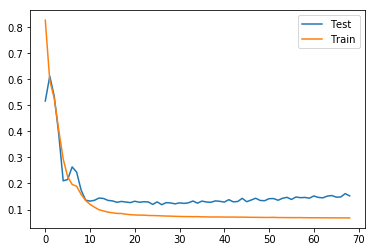

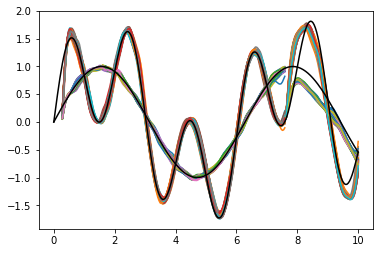

Epoch 70/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0676 - acc: 0.9101 - val_loss: 0.1500 - val_acc: 0.7817


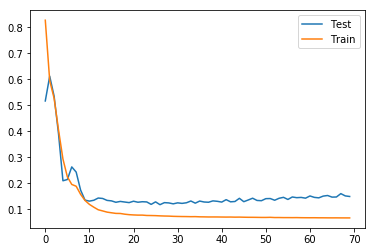

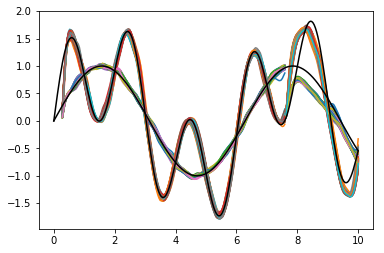

Epoch 71/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0674 - acc: 0.9102 - val_loss: 0.1602 - val_acc: 0.7798


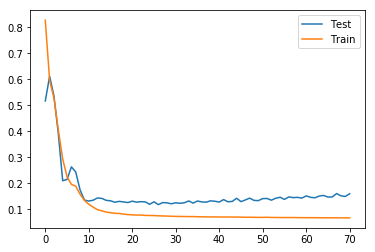

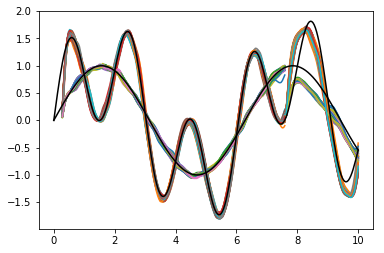

Epoch 72/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0674 - acc: 0.9099 - val_loss: 0.1530 - val_acc: 0.7805


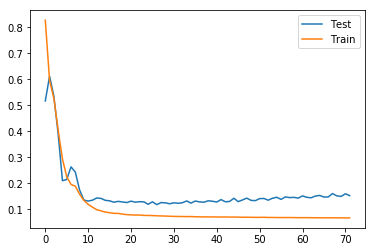

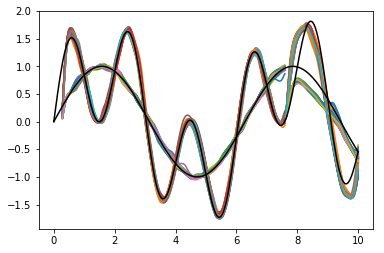

Epoch 73/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0673 - acc: 0.9093 - val_loss: 0.1500 - val_acc: 0.7813


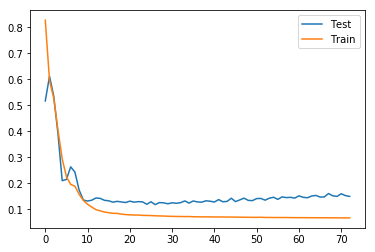

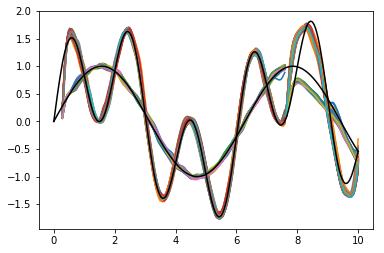

Epoch 74/10000000
100/100 [==============================] - 4s 45ms/step - loss: 0.0672 - acc: 0.9093 - val_loss: 0.1582 - val_acc: 0.7798


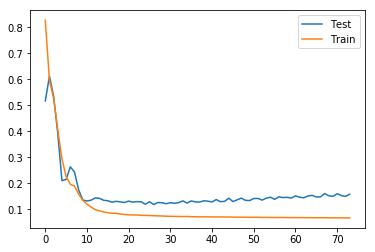

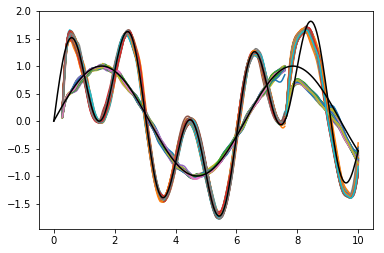

Epoch 75/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0671 - acc: 0.9106 - val_loss: 0.1534 - val_acc: 0.7805


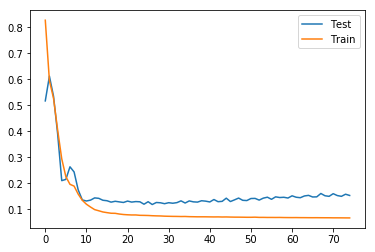

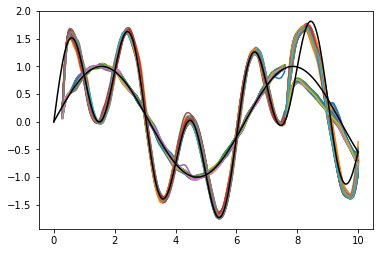

Epoch 76/10000000
100/100 [==============================] - 5s 49ms/step - loss: 0.0671 - acc: 0.9092 - val_loss: 0.1601 - val_acc: 0.7805


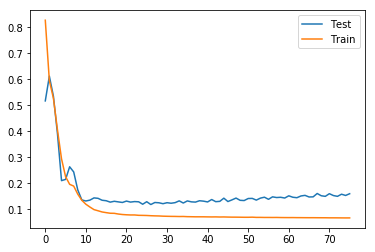

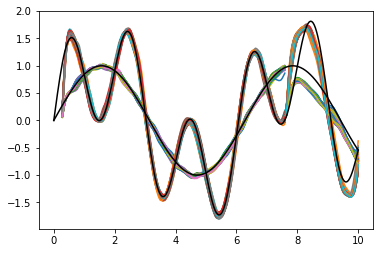

Epoch 77/10000000
100/100 [==============================] - 4s 44ms/step - loss: 0.0670 - acc: 0.9101 - val_loss: 0.1603 - val_acc: 0.7798


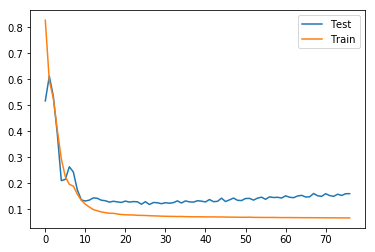

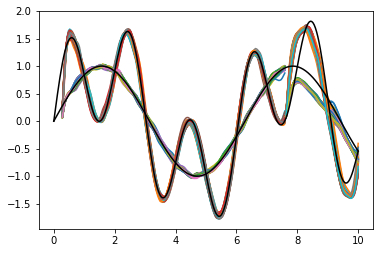

Epoch 78/10000000
100/100 [==============================] - 5s 48ms/step - loss: 0.0670 - acc: 0.9095 - val_loss: 0.1555 - val_acc: 0.7807


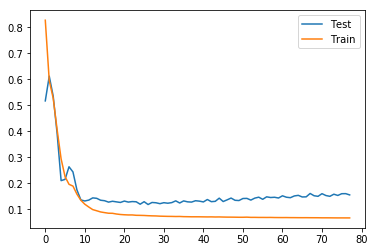

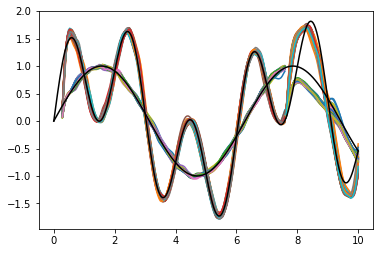

Epoch 79/10000000
100/100 [==============================] - 4s 45ms/step - loss: 0.0668 - acc: 0.9097 - val_loss: 0.1576 - val_acc: 0.7813


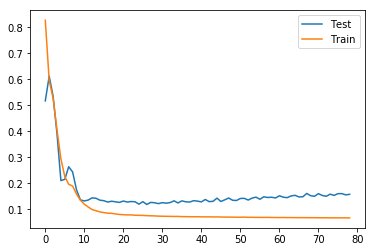

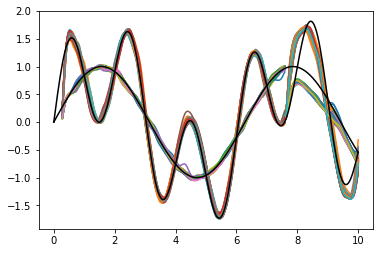

Epoch 80/10000000
100/100 [==============================] - 4s 44ms/step - loss: 0.0669 - acc: 0.9096 - val_loss: 0.1554 - val_acc: 0.7808


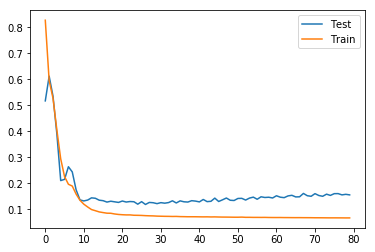

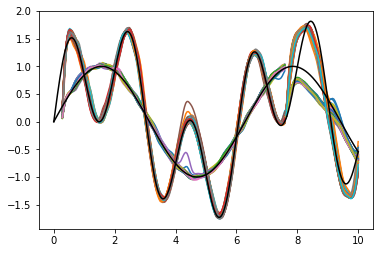

Epoch 81/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0670 - acc: 0.9107 - val_loss: 0.1564 - val_acc: 0.7805


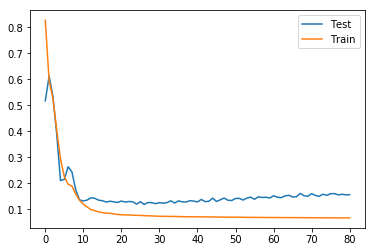

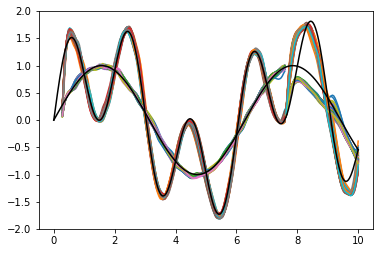

Epoch 82/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0671 - acc: 0.9093 - val_loss: 0.1663 - val_acc: 0.7785


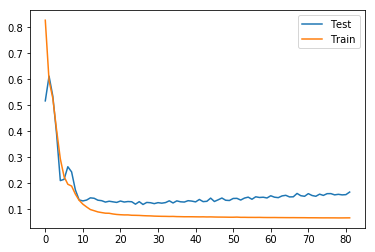

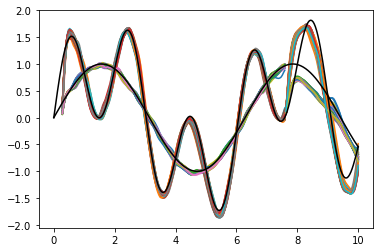

Epoch 83/10000000
100/100 [==============================] - 4s 44ms/step - loss: 0.0677 - acc: 0.9098 - val_loss: 0.1595 - val_acc: 0.7805


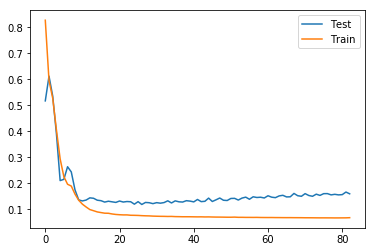

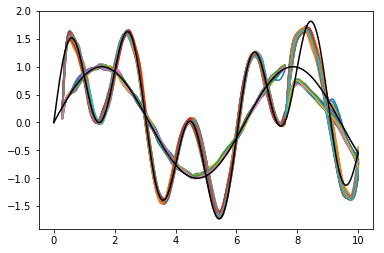

Epoch 84/10000000
100/100 [==============================] - 5s 49ms/step - loss: 0.0673 - acc: 0.9098 - val_loss: 0.1585 - val_acc: 0.7803


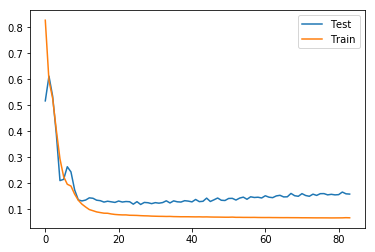

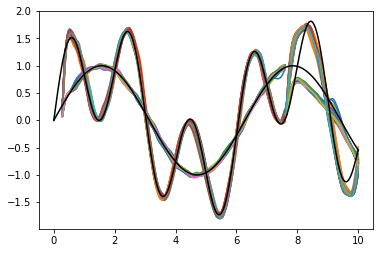

Epoch 85/10000000
100/100 [==============================] - 4s 44ms/step - loss: 0.0671 - acc: 0.9090 - val_loss: 0.1642 - val_acc: 0.7800


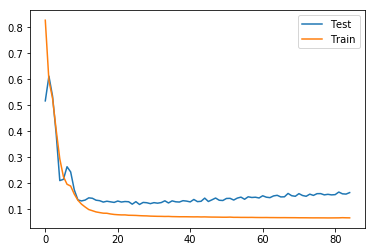

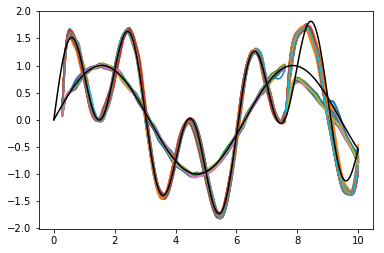

Epoch 86/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0668 - acc: 0.9098 - val_loss: 0.1622 - val_acc: 0.7793


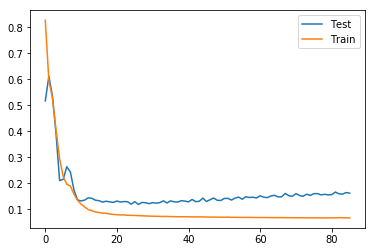

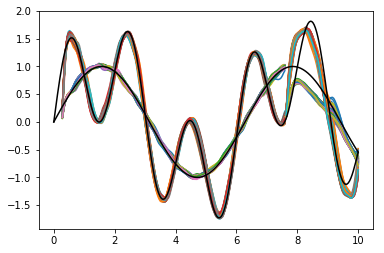

Epoch 87/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0667 - acc: 0.9093 - val_loss: 0.1589 - val_acc: 0.7802


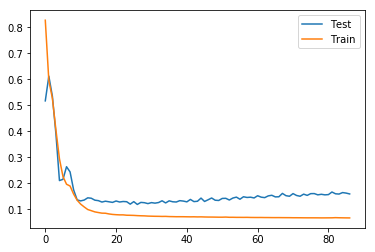

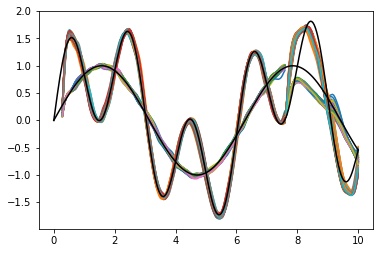

Epoch 88/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0665 - acc: 0.9096 - val_loss: 0.1599 - val_acc: 0.7803


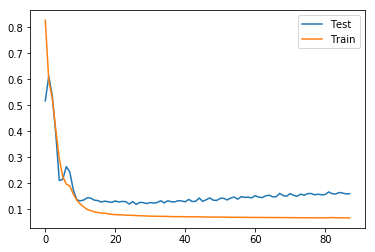

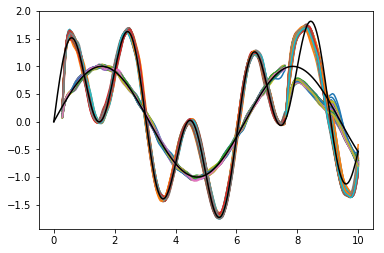

Epoch 89/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0664 - acc: 0.9107 - val_loss: 0.1636 - val_acc: 0.7792


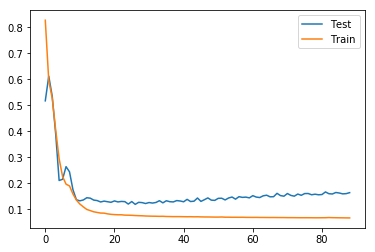

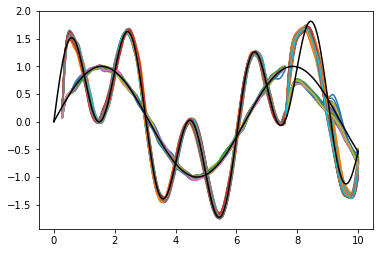

Epoch 90/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0663 - acc: 0.9097 - val_loss: 0.1613 - val_acc: 0.7805


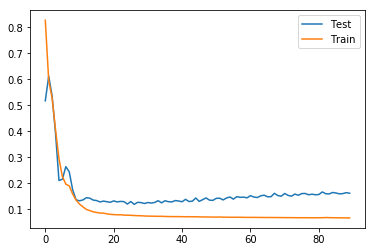

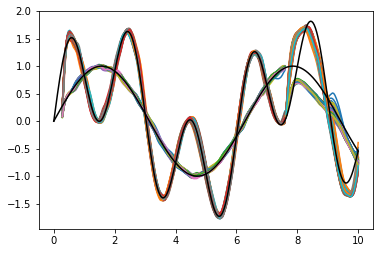

Epoch 91/10000000
100/100 [==============================] - 5s 46ms/step - loss: 0.0663 - acc: 0.9103 - val_loss: 0.1666 - val_acc: 0.7793


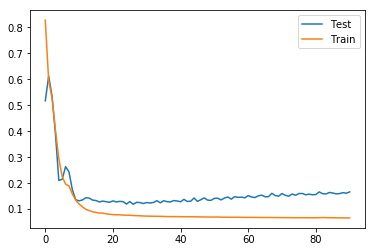

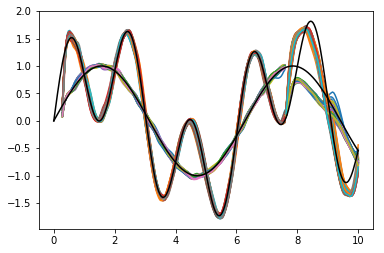

Epoch 92/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0663 - acc: 0.9102 - val_loss: 0.1664 - val_acc: 0.7802


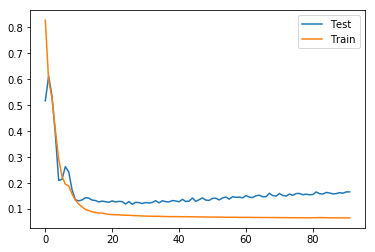

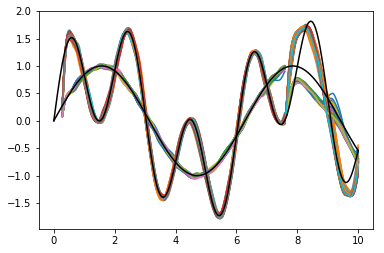

Epoch 93/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0662 - acc: 0.9102 - val_loss: 0.1628 - val_acc: 0.7795


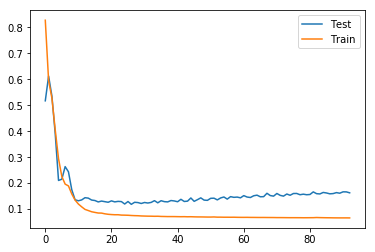

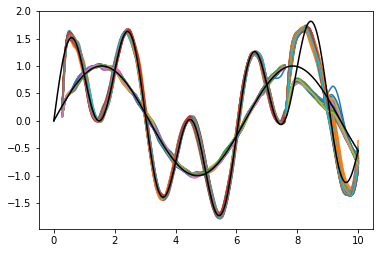

Epoch 94/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0663 - acc: 0.9110 - val_loss: 0.1677 - val_acc: 0.7797


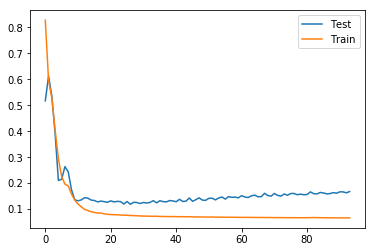

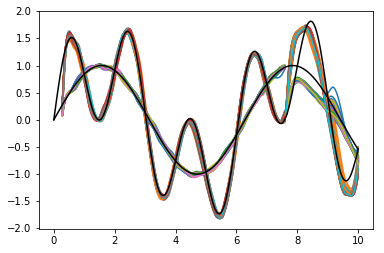

Epoch 95/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0664 - acc: 0.9103 - val_loss: 0.1723 - val_acc: 0.7787


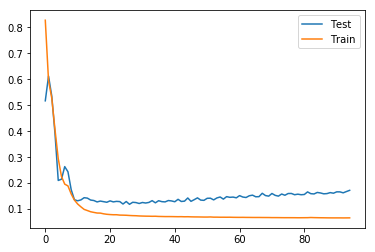

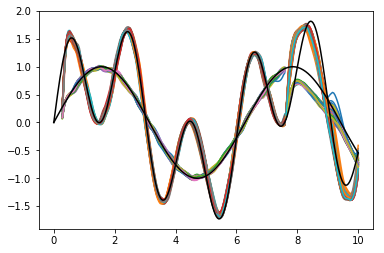

Epoch 96/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0665 - acc: 0.9089 - val_loss: 0.1666 - val_acc: 0.7792


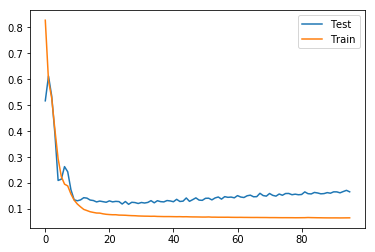

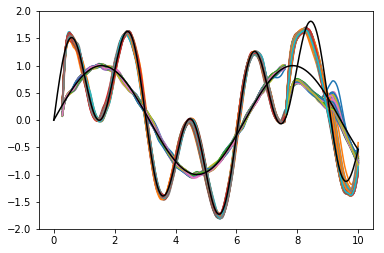

Epoch 97/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0663 - acc: 0.9089 - val_loss: 0.1688 - val_acc: 0.7802


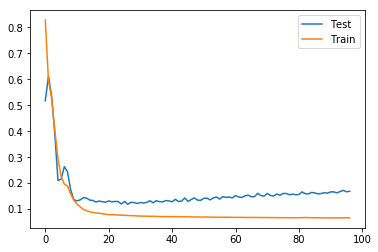

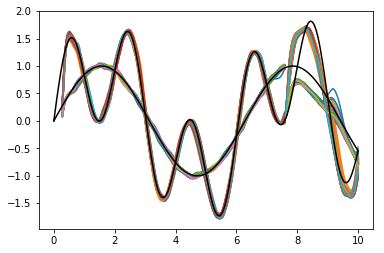

Epoch 98/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0663 - acc: 0.9099 - val_loss: 0.1712 - val_acc: 0.7787


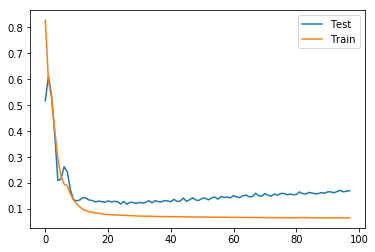

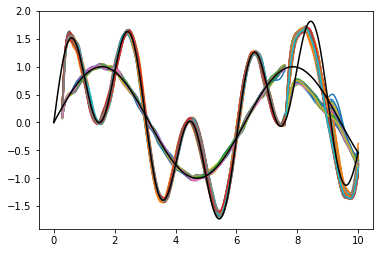

Epoch 99/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0663 - acc: 0.9086 - val_loss: 0.1676 - val_acc: 0.7793


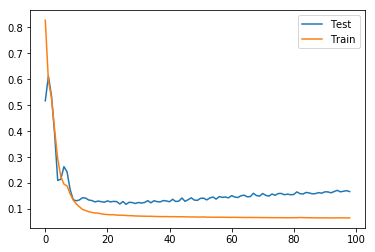

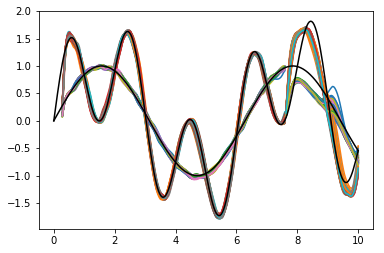

Epoch 100/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0659 - acc: 0.9100 - val_loss: 0.1711 - val_acc: 0.7783


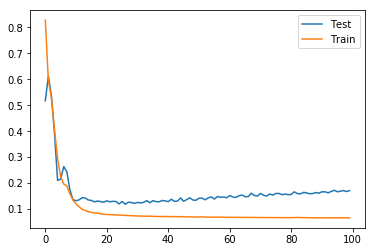

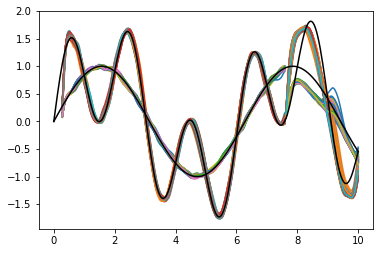

Epoch 101/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0658 - acc: 0.9101 - val_loss: 0.1715 - val_acc: 0.7797


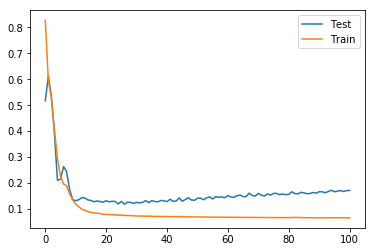

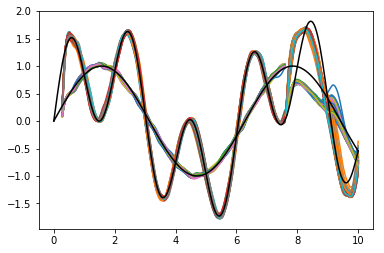

Epoch 102/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0659 - acc: 0.9093 - val_loss: 0.1680 - val_acc: 0.7798


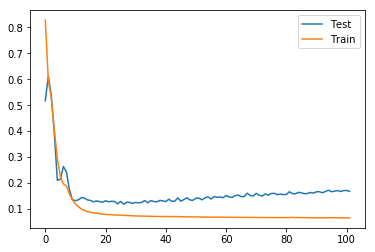

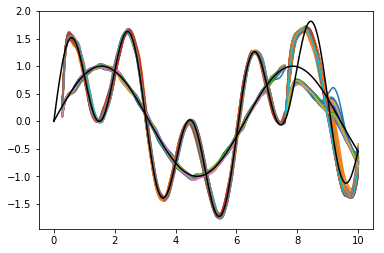

Epoch 103/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0660 - acc: 0.9090 - val_loss: 0.1652 - val_acc: 0.7785


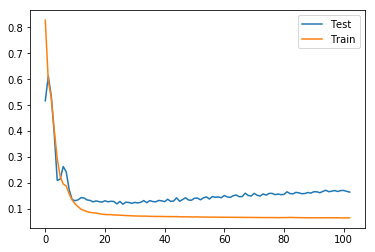

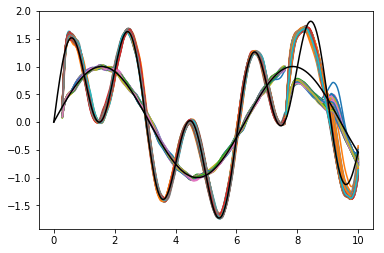

Epoch 104/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0661 - acc: 0.9106 - val_loss: 0.1682 - val_acc: 0.7778


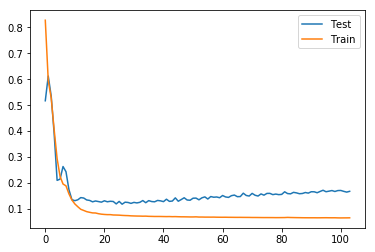

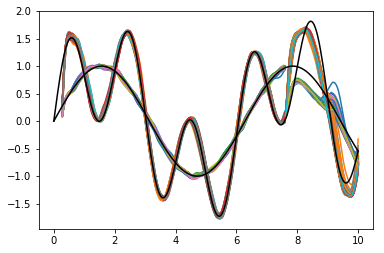

Epoch 105/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0660 - acc: 0.9099 - val_loss: 0.1651 - val_acc: 0.7763


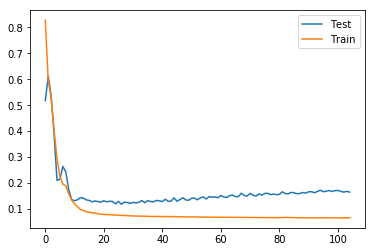

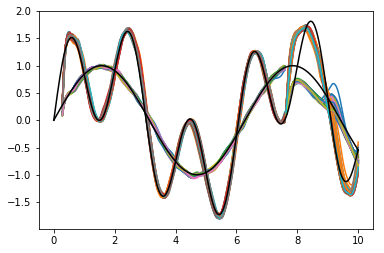

Epoch 106/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0663 - acc: 0.9101 - val_loss: 0.1690 - val_acc: 0.7782


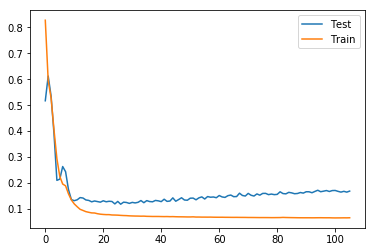

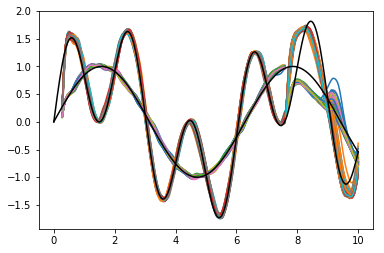

Epoch 107/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0660 - acc: 0.9094 - val_loss: 0.1643 - val_acc: 0.7798


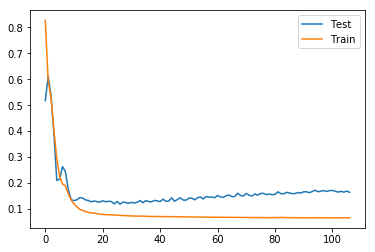

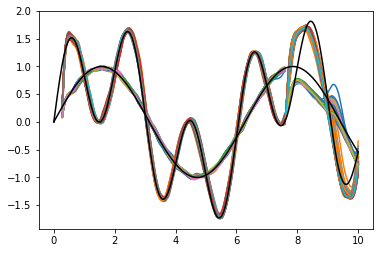

Epoch 108/10000000
100/100 [==============================] - 4s 45ms/step - loss: 0.0660 - acc: 0.9097 - val_loss: 0.1638 - val_acc: 0.7795


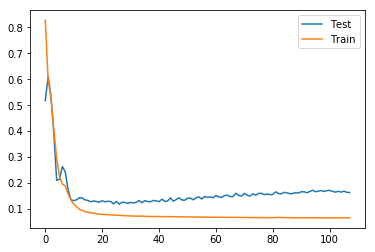

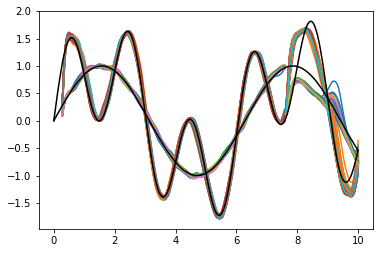

Epoch 109/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0658 - acc: 0.9102 - val_loss: 0.1643 - val_acc: 0.7767


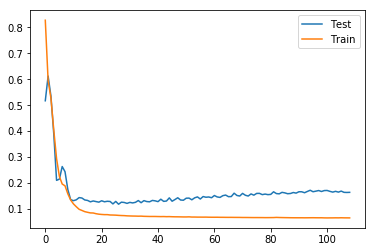

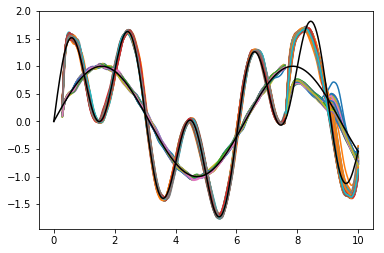

Epoch 110/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0660 - acc: 0.9096 - val_loss: 0.1681 - val_acc: 0.7793


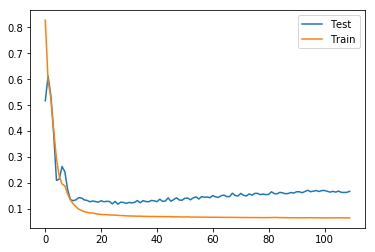

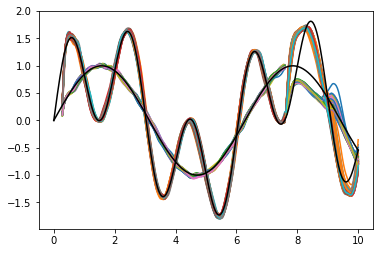

Epoch 111/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0659 - acc: 0.9105 - val_loss: 0.1744 - val_acc: 0.7785


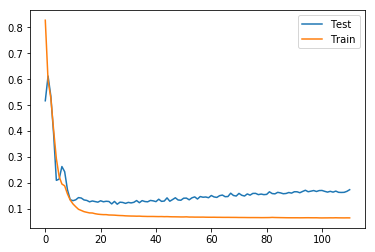

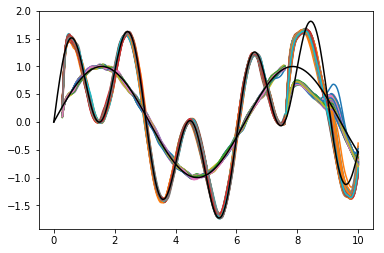

Epoch 112/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0660 - acc: 0.9092 - val_loss: 0.1724 - val_acc: 0.7787


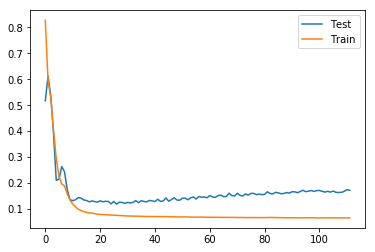

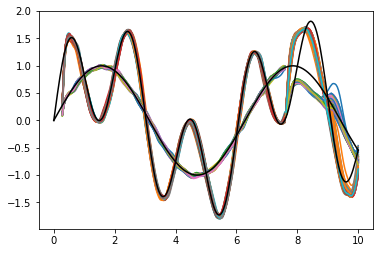

Epoch 113/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0659 - acc: 0.9112 - val_loss: 0.1707 - val_acc: 0.7788


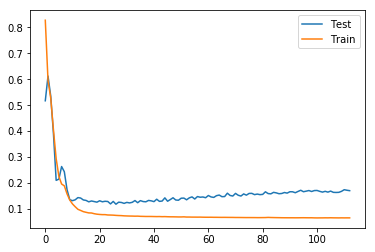

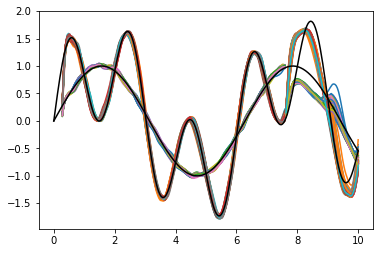

Epoch 114/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0656 - acc: 0.9108 - val_loss: 0.1688 - val_acc: 0.7765


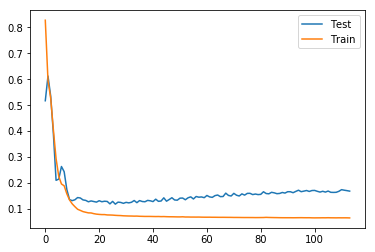

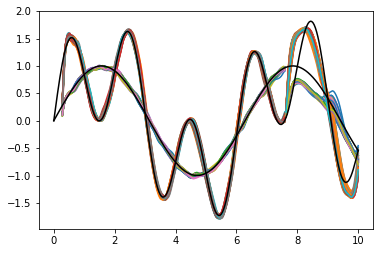

Epoch 115/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0656 - acc: 0.9101 - val_loss: 0.1683 - val_acc: 0.7772


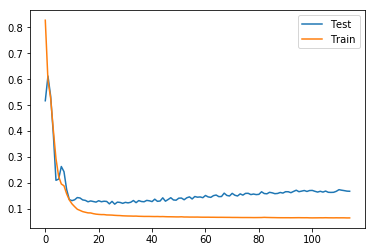

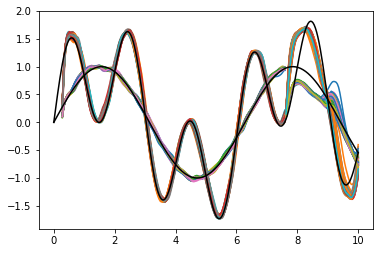

Epoch 116/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0658 - acc: 0.9105 - val_loss: 0.1687 - val_acc: 0.7778


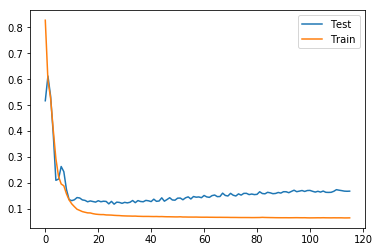

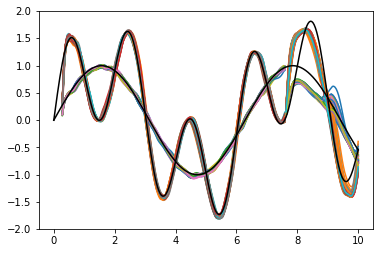

Epoch 117/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0656 - acc: 0.9098 - val_loss: 0.1703 - val_acc: 0.7795


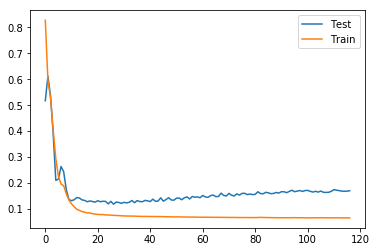

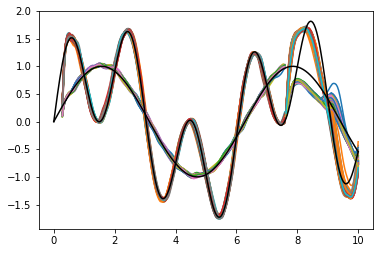

Epoch 118/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0655 - acc: 0.9090 - val_loss: 0.1763 - val_acc: 0.7783


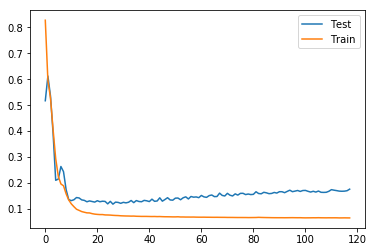

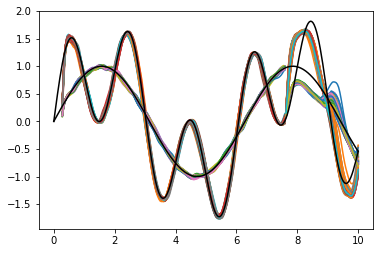

Epoch 119/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0656 - acc: 0.9101 - val_loss: 0.1714 - val_acc: 0.7793


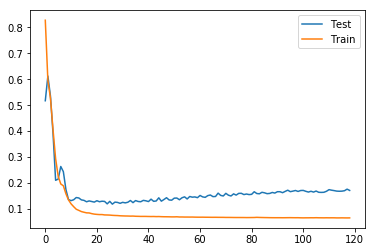

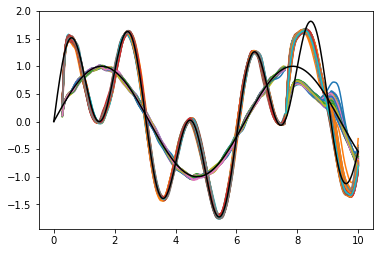

Epoch 120/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0657 - acc: 0.9084 - val_loss: 0.1711 - val_acc: 0.7777


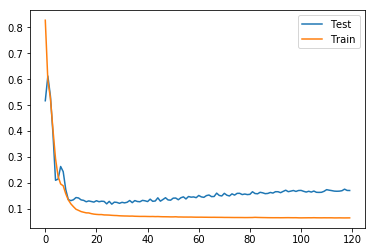

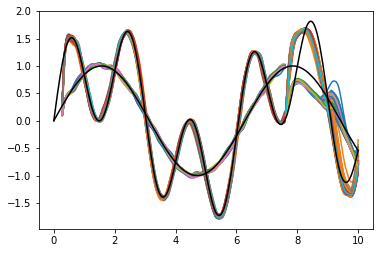

Epoch 121/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0654 - acc: 0.9104 - val_loss: 0.1705 - val_acc: 0.7768


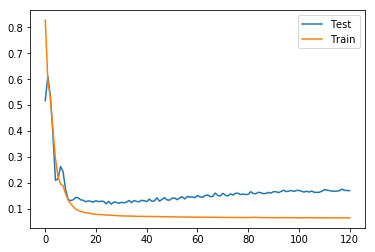

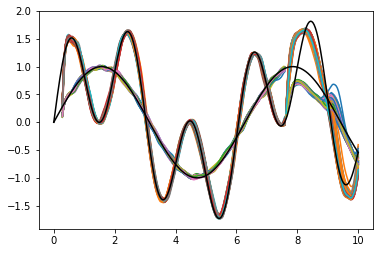

Epoch 122/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0653 - acc: 0.9111 - val_loss: 0.1705 - val_acc: 0.7793


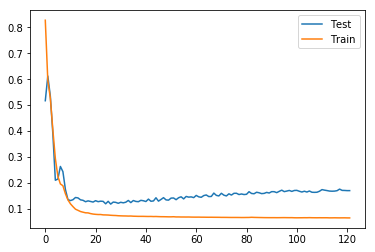

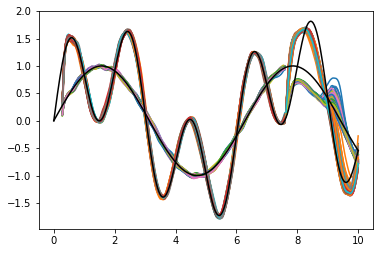

Epoch 123/10000000
100/100 [==============================] - 4s 43ms/step - loss: 0.0653 - acc: 0.9096 - val_loss: 0.1744 - val_acc: 0.7777


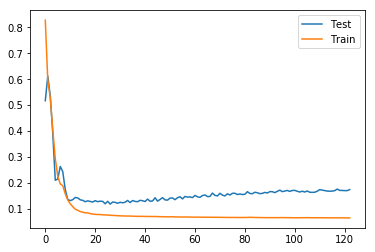

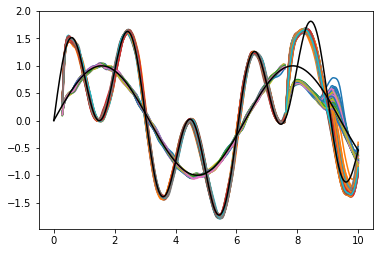

Epoch 124/10000000
100/100 [==============================] - 4s 41ms/step - loss: 0.0652 - acc: 0.9100 - val_loss: 0.1726 - val_acc: 0.7782


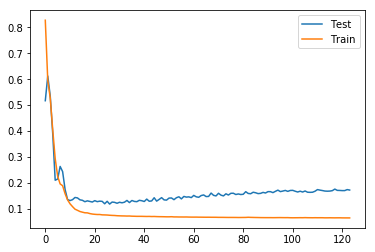

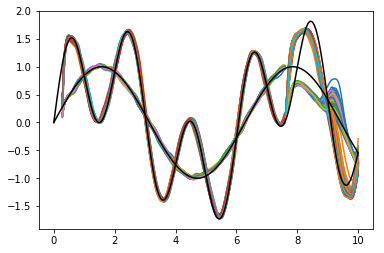

Epoch 125/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0652 - acc: 0.9097 - val_loss: 0.1792 - val_acc: 0.7775


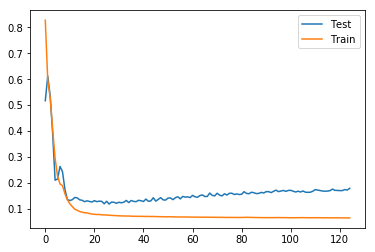

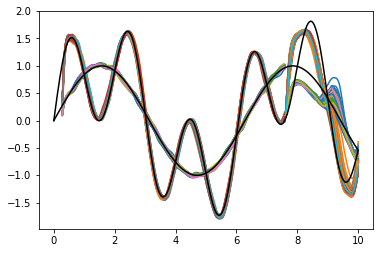

Epoch 126/10000000
100/100 [==============================] - 4s 45ms/step - loss: 0.0653 - acc: 0.9091 - val_loss: 0.1799 - val_acc: 0.7792


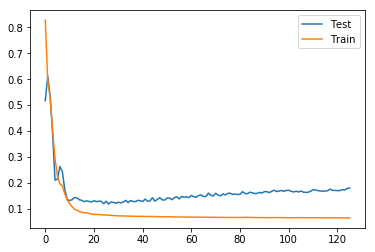

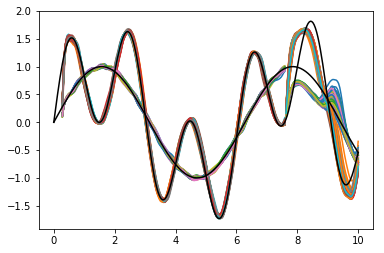

Epoch 127/10000000
100/100 [==============================] - 4s 42ms/step - loss: 0.0654 - acc: 0.9098 - val_loss: 0.1882 - val_acc: 0.7778


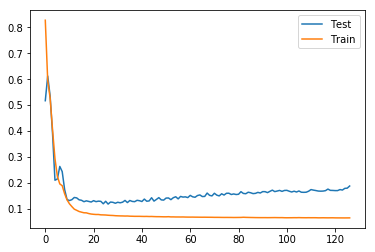

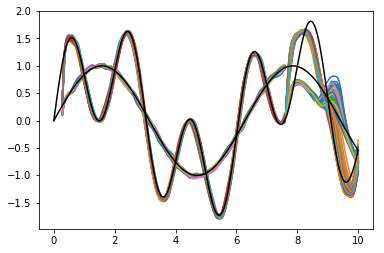

In [108]:
history = model.fit(x_train, y_train, epochs=10000000, validation_data=[x_test, y_test], callbacks=[display, early_stopping, best_model])